# **Open_CV Implementation**

In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
import cv2 as cv
from google.colab.patches import cv2_imshow
import numpy as np

## **Reading an Image**

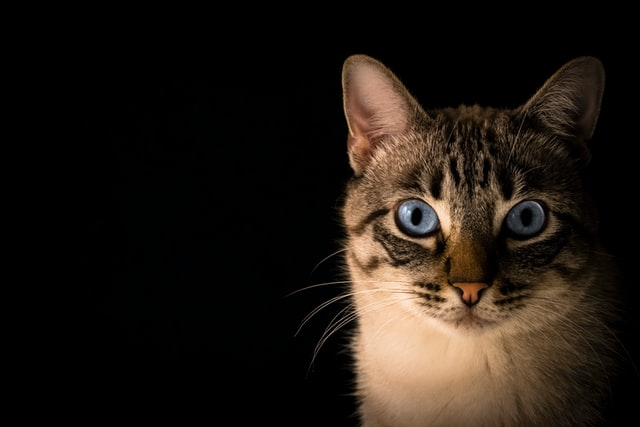

In [3]:
img = cv.imread('/content/drive/MyDrive/DataSets/Open_CV/Photos/cat.jpg')  # Small Image
cv2_imshow(img)

In [4]:
img = cv.imread('/content/drive/MyDrive/DataSets/Open_CV/Photos/cat_large.jpg')  # Large Image
cv2_imshow(img)

Output hidden; open in https://colab.research.google.com to view.

## **Reading a Video**

In [5]:
capture = cv.VideoCapture('/content/drive/MyDrive/DataSets/Open_CV/Videos/dog.mp4')

In [6]:
# Commenting because it's taking to long to display output.
"""while True:
    isTrue, frame = capture.read()
    
    # if cv.waitKey(20) & 0xFF==ord('d'):
    # This is the preferred way - if `isTrue` is false (the frame could 
    # not be read, or we're at the end of the video), we immediately
    # break from the loop. 
    if isTrue:    
        cv2_imshow(frame)
        if cv.waitKey(20) & 0xFF==ord('d'):
            break            
    else:
        break

capture.release()
cv.destroyAllWindows() """


"while True:\n    isTrue, frame = capture.read()\n    \n    # if cv.waitKey(20) & 0xFF==ord('d'):\n    # This is the preferred way - if `isTrue` is false (the frame could \n    # not be read, or we're at the end of the video), we immediately\n    # break from the loop. \n    if isTrue:    \n        cv2_imshow(frame)\n        if cv.waitKey(20) & 0xFF==ord('d'):\n            break            \n    else:\n        break\n\ncapture.release()\ncv.destroyAllWindows() "

## **Resizing & Rescaling**

In [7]:
# Defining function for resizing image and video
def rescaleFrame(frame, scale = 0.25):
  width  = int(frame.shape[1] * scale)
  height = int(frame.shape[0] * scale)

  dimensions = (width, height)
  return cv.resize(frame, dimensions, interpolation = cv.INTER_AREA)

In [8]:
capture = cv.VideoCapture('/content/drive/MyDrive/DataSets/Open_CV/Videos/dog.mp4')

In [9]:
# Commenting as it is taking too long to display output
# Resizing video
"""while True:
    isTrue, frame = capture.read()
    frame_resized = rescaleFrame(frame)
    cv2_imshow(frame_resized)
    
capture.release()
cv.destroyAllWindows()"""

    

'while True:\n    isTrue, frame = capture.read()\n    frame_resized = rescaleFrame(frame)\n    cv2_imshow(frame_resized)\n    \ncapture.release()\ncv.destroyAllWindows()'

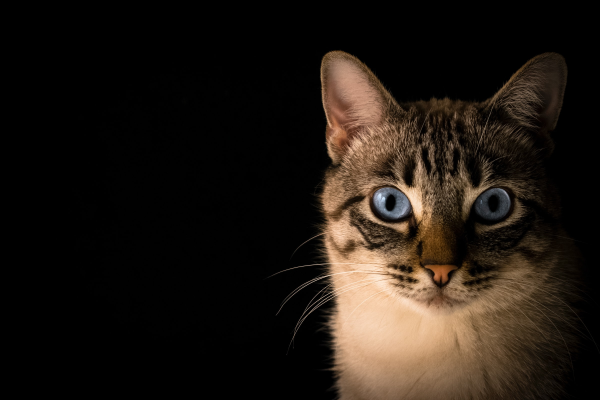

In [10]:
# Resizing Image
resized_image = rescaleFrame(img)
cv2_imshow(resized_image)

In [11]:
# Commenting because this method only works for live video
"""def changeRes(width, height):
  capture.set(3, width)
  capture.set(4, height)"""

'def changeRes(width, height):\n  capture.set(3, width)\n  capture.set(4, height)'

## **Drawing shapes & putting texts**

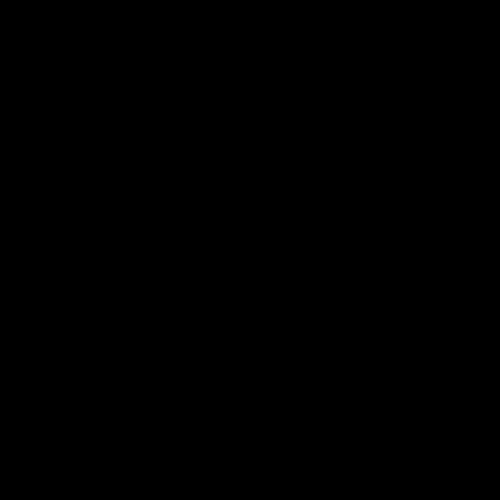

In [12]:
blank = np.zeros((500,500,3), dtype='uint8')  # Creating blank image
cv2_imshow(blank)

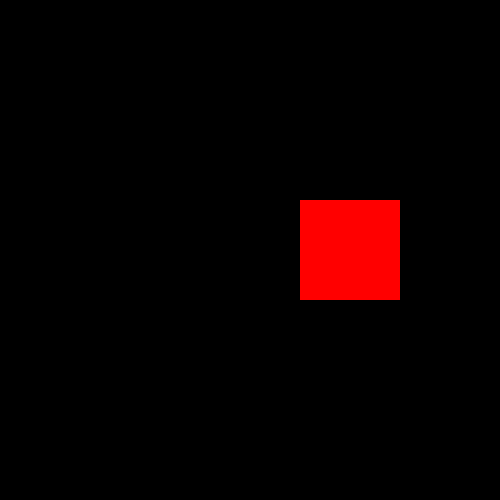

In [13]:
# Paint the image a certain colour
blank[200:300, 300:400] = 0,0,255
cv2_imshow(blank)

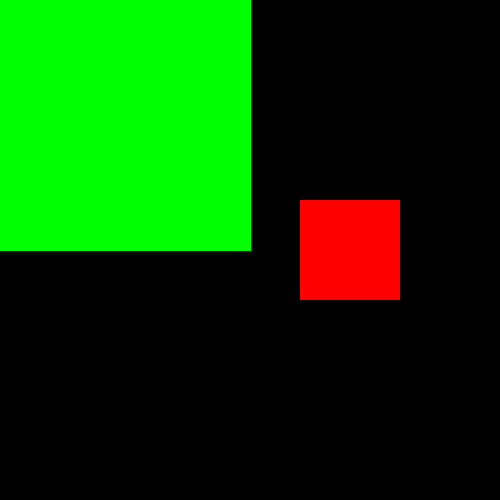

In [14]:
# 2. Draw a Rectangle
cv.rectangle(blank, (0,0), (blank.shape[1]//2, blank.shape[0]//2), (0,255,0), thickness=-1)
cv2_imshow(blank)

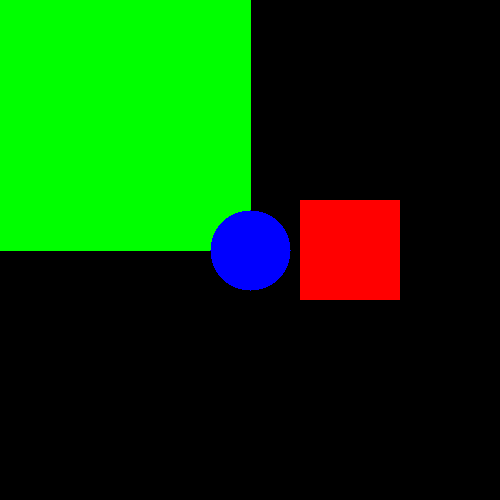

In [15]:
# Draw A circle
cv.circle(blank, (blank.shape[1]//2, blank.shape[0]//2), 40, (255,0,0), thickness=-1)
cv2_imshow(blank)

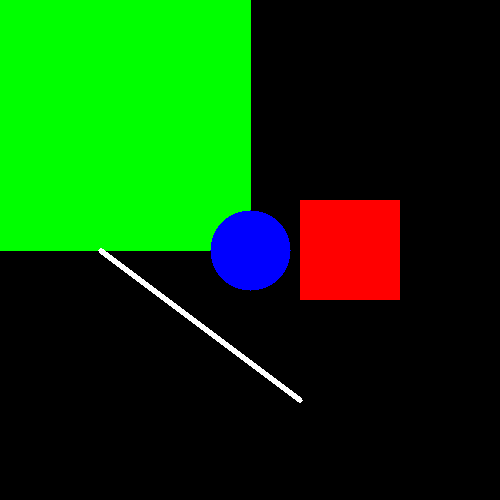

In [16]:
#  Draw a line
cv.line(blank, (100,250), (300,400), (255,255,255), thickness=3)
cv2_imshow(blank)

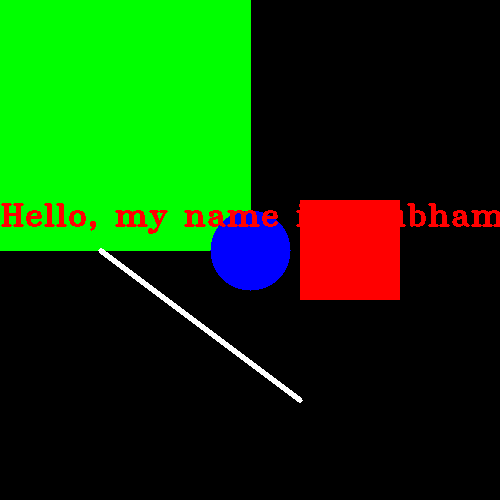

In [17]:
# Write text
cv.putText(blank, 'Hello, my name is Shubham!!!', (0,225), cv.FONT_HERSHEY_TRIPLEX, 1.0, (0,0,255), 2)
cv2_imshow(blank)

## **Essential Functions**

In [18]:
img = cv.imread('/content/drive/MyDrive/DataSets/Open_CV/Photos/park.jpg')

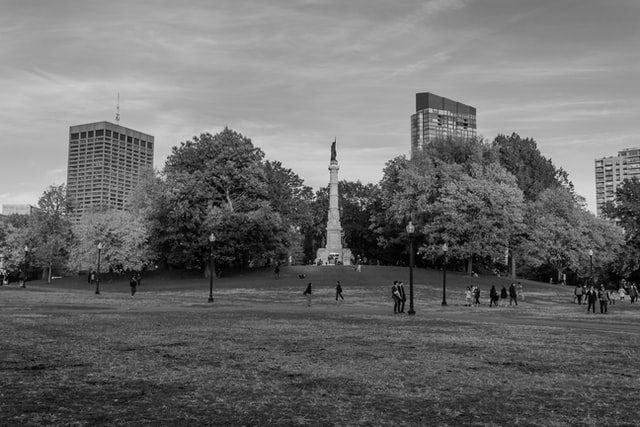

In [19]:
# Converting to grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv2_imshow(gray)

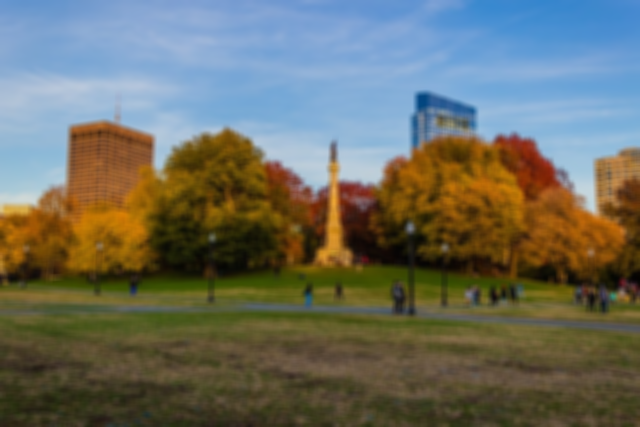

In [20]:
# Blur 
blur = cv.GaussianBlur(img, (7,7), cv.BORDER_DEFAULT)  # kernel size must be odd number
cv2_imshow(blur)

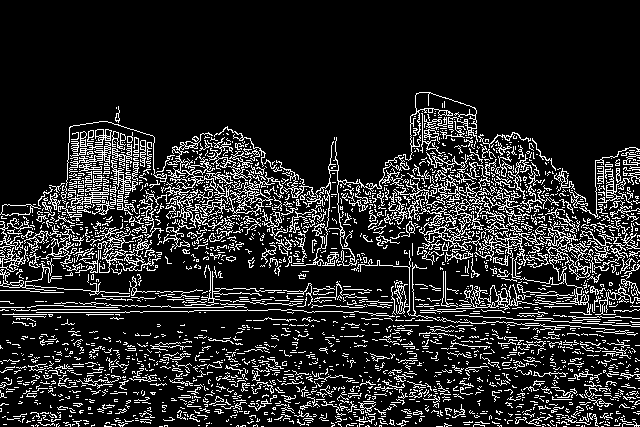

In [21]:
# Edge Cascade
canny = cv.Canny(img, 125, 175)
cv2_imshow(canny)

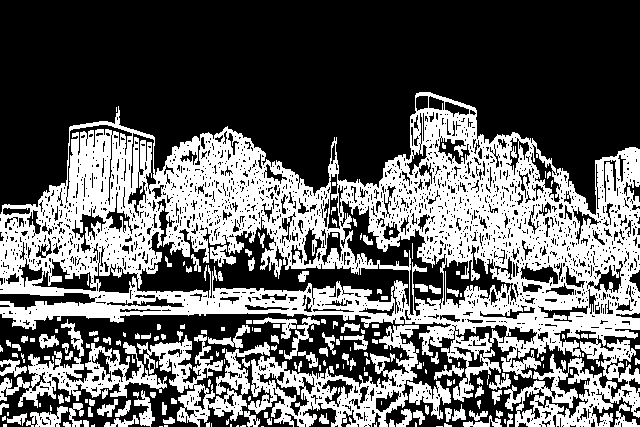

In [22]:
# Dilating the image
dilated = cv.dilate(canny, (7,7), iterations=3)
cv2_imshow(dilated)

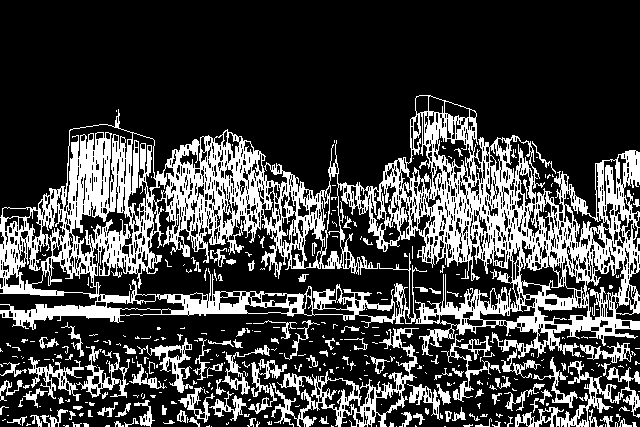

In [23]:
# Eroding
eroded = cv.erode(dilated, (7,7), iterations=3)
cv2_imshow(eroded)

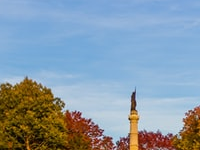

In [24]:
# Cropping
cropped = img[50:200, 200:400]
cv2_imshow(cropped)

## **Image Transformations**

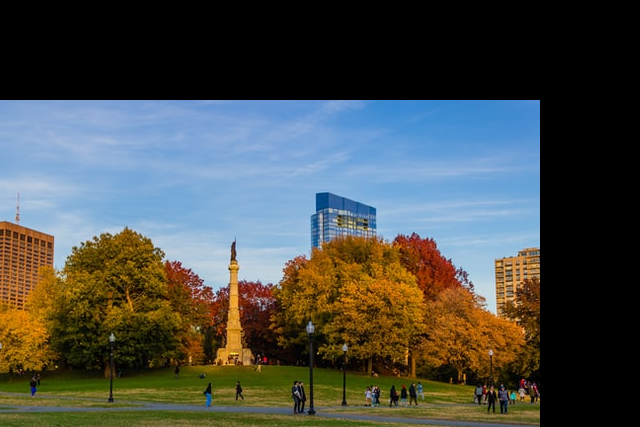

In [25]:
# Translation
def translate(img, x, y):  # x, y are number of pixels we need to shift
    transMat = np.float32([[1,0,x],[0,1,y]])
    dimensions = (img.shape[1], img.shape[0])
    return cv.warpAffine(img, transMat, dimensions)

# -x --> Left
# -y --> Up
# x --> Right
# y --> Down

translated = translate(img, -100, 100)
cv2_imshow(translated)

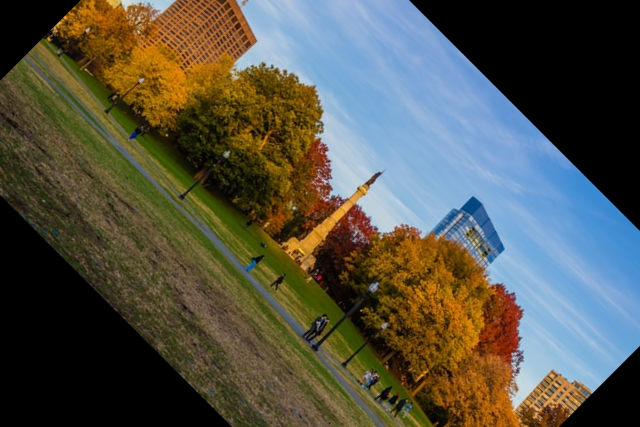

In [26]:
# Rotation
def rotate(img, angle, rotPoint=None):
    (height,width) = img.shape[:2]

    if rotPoint is None:
        rotPoint = (width//2,height//2) # for rotation around the center
    
    rotMat = cv.getRotationMatrix2D(rotPoint, angle, 1.0)
    dimensions = (width,height)

    return cv.warpAffine(img, rotMat, dimensions)

rotated = rotate(img, -45)
cv2_imshow(rotated)

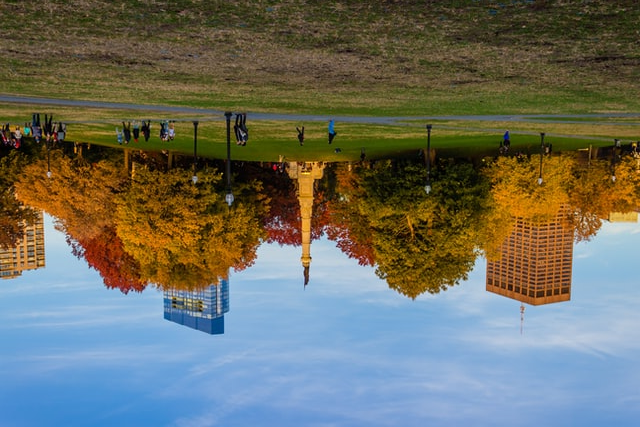

In [27]:
# Flipping
flip = cv.flip(img, -1)
cv2_imshow(flip)


## **Contour Detection**

69 contour(s) found!


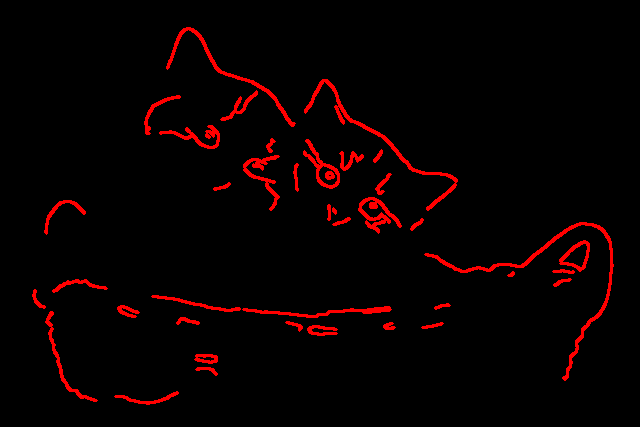

In [28]:
img = cv.imread('/content/drive/MyDrive/DataSets/Open_CV/Photos/cats 2.jpg')

blank = np.zeros(img.shape, dtype='uint8')
#cv.imshow('Blank', blank)

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
#cv.imshow('Gray', gray)

blur = cv.GaussianBlur(gray, (5,5), cv.BORDER_DEFAULT)
#cv2_imshow('Blur', blur)

canny = cv.Canny(blur, 125, 175)
#cv2_imshow('Canny Edges', canny)

ret, thresh = cv.threshold(gray, 125, 255, cv.THRESH_BINARY)
# cv2_imshow('Thresh', thresh)

# contours is a python list of all the co-ordinates of the contours found i an image
# hierarchies represent hierarchical representation of the contours
contours, hierarchies = cv.findContours(canny, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
print(f'{len(contours)} contour(s) found!')

cv.drawContours(blank, contours, -1, (0,0,255), 2)
cv2_imshow(blank)

## **Thresholding**

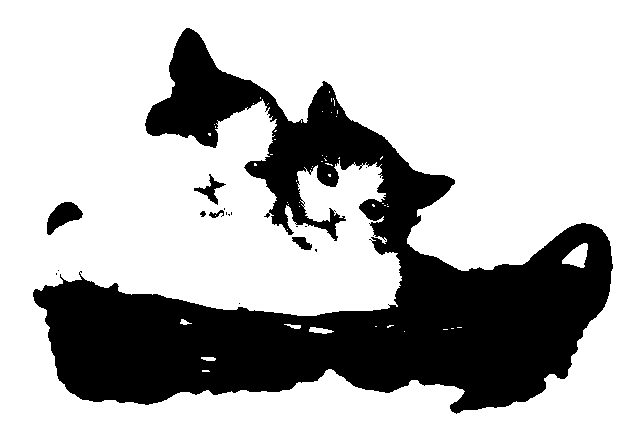

In [29]:
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
#cv2_imshow('Gray', gray)

# Simple Thresholding
threshold, thresh = cv.threshold(gray, 150, 255, cv.THRESH_BINARY )
cv2_imshow(thresh)


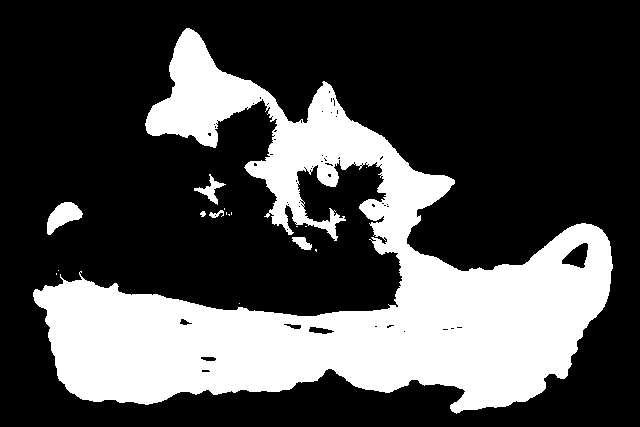

In [30]:
threshold, thresh_inv = cv.threshold(gray, 150, 255, cv.THRESH_BINARY_INV )
cv2_imshow(thresh_inv)

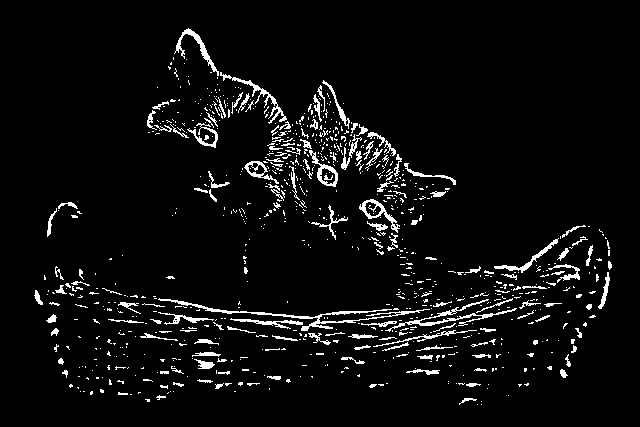

In [31]:

# Adaptive Thresholding
adaptive_thresh = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY_INV, 11, 9)
cv2_imshow(adaptive_thresh)

## **Color Spaces**

In [32]:
img = cv.imread('/content/drive/MyDrive/DataSets/Open_CV/Photos/park.jpg')

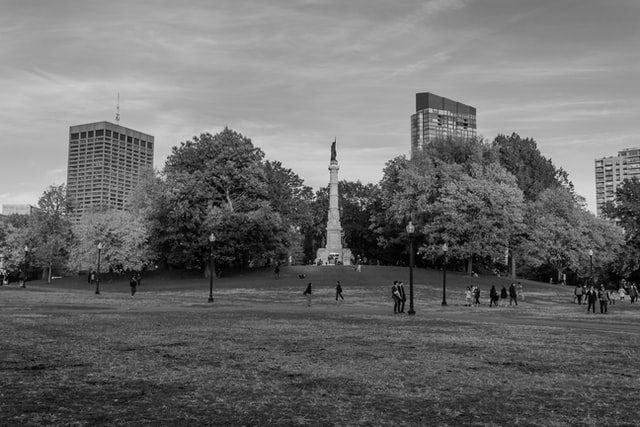

In [33]:
# BGR to Grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv2_imshow(gray)

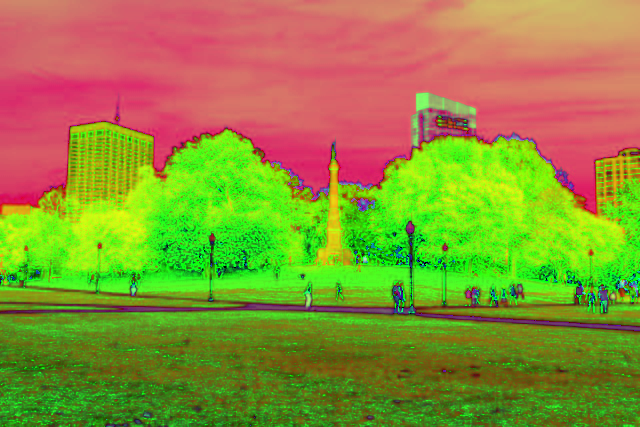

In [34]:
# BGR to HSV
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
cv2_imshow(hsv)

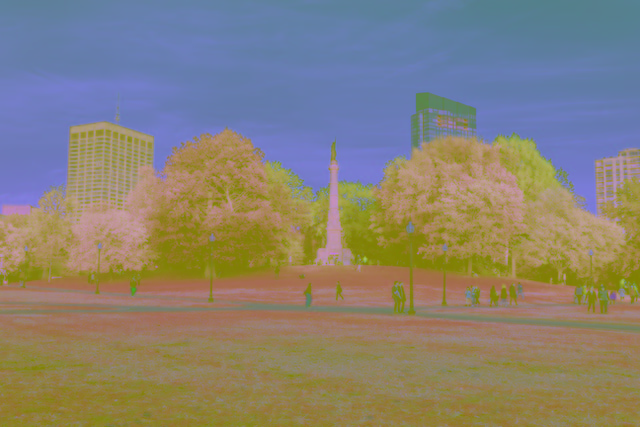

In [35]:
# BGR to L*a*b
lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)
cv2_imshow(lab)

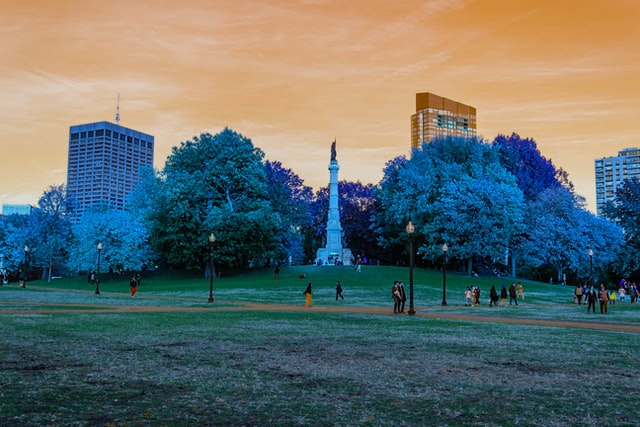

In [36]:
# BGR to RGB
rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
cv2_imshow(rgb)

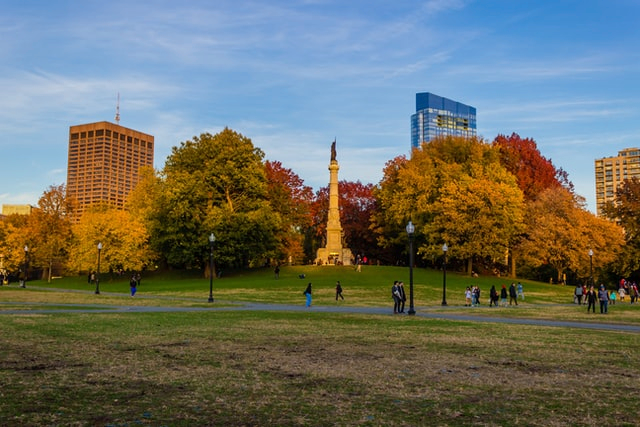

In [37]:
# HSV to BGR
lab_bgr = cv.cvtColor(lab, cv.COLOR_LAB2BGR)
cv2_imshow(lab_bgr)

## **Color Channels**

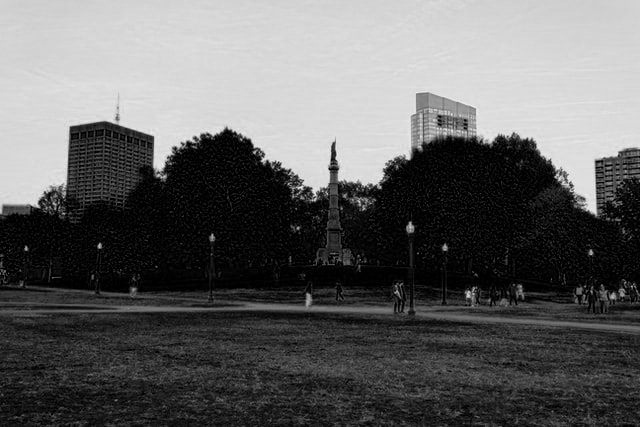

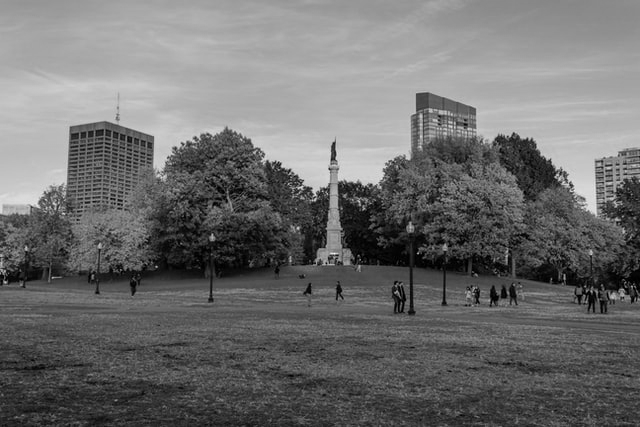

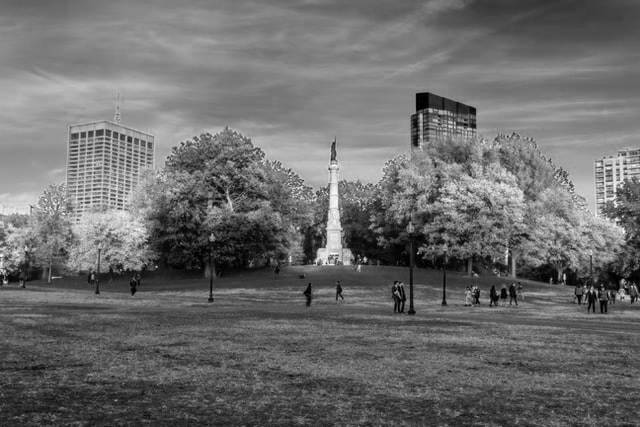

In [38]:
b, g, r = cv.split(img)
cv2_imshow(b)
cv2_imshow(g)
cv2_imshow(r)

In [39]:
print(img.shape)
print(b.shape)
print(g.shape)
print(r.shape)

(427, 640, 3)
(427, 640)
(427, 640)
(427, 640)


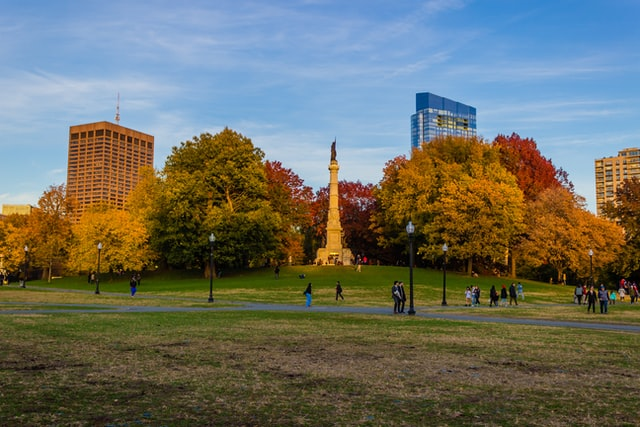

In [40]:
# Merging color channels together
merged = cv.merge([b, g, r])
cv2_imshow(merged)

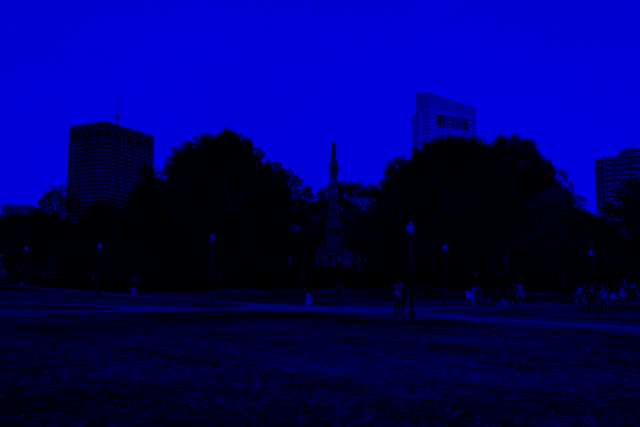

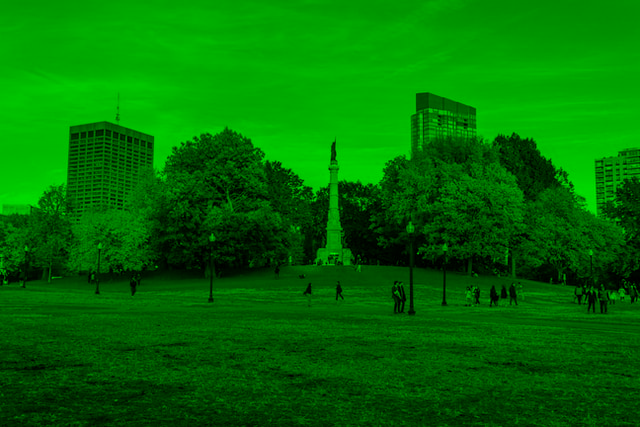

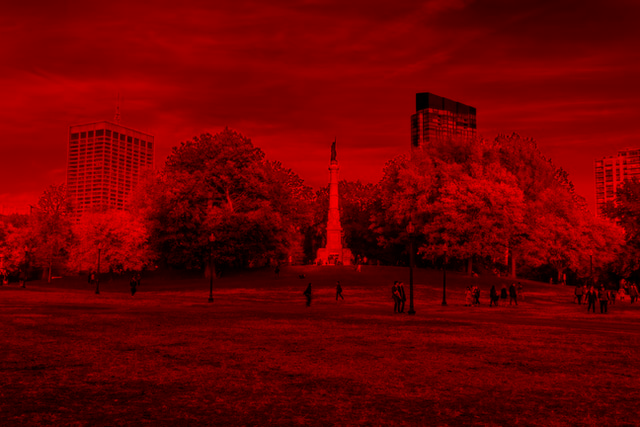

In [42]:
blank = np.zeros(img.shape[:2], dtype = 'uint8')

b, g, r = cv.split(img)

blue = cv.merge([b, blank, blank])
green = cv.merge([blank,g, blank])
red = cv.merge([blank, blank, r])

cv2_imshow(blue)
cv2_imshow(green)
cv2_imshow(red)




## **Blurring Techniques**

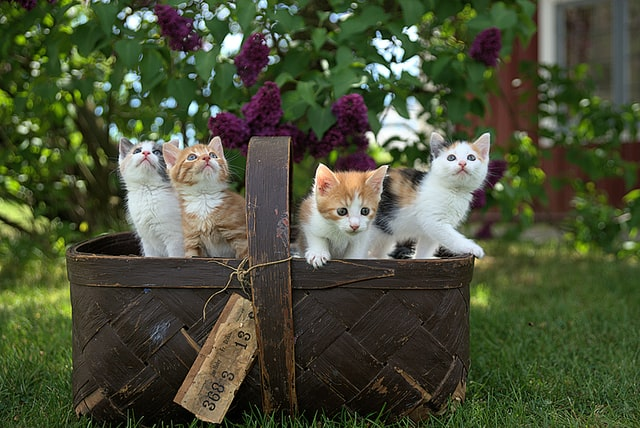

In [43]:
img = cv.imread('/content/drive/MyDrive/DataSets/Open_CV/Photos/cats.jpg')
cv2_imshow(img)

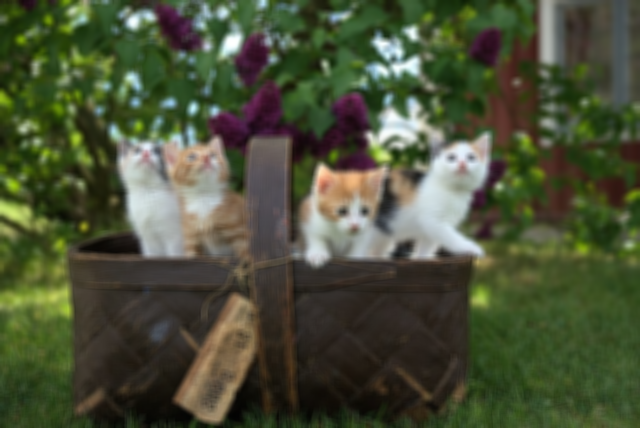

In [50]:
# Averaging
average = cv.blur(img, (7,7))
cv2_imshow(average)

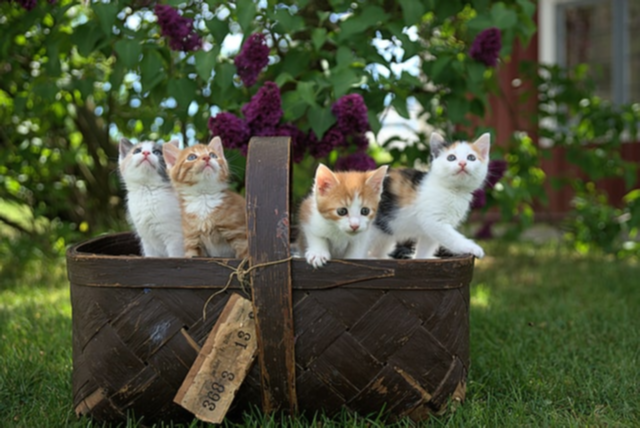

In [47]:
# Gaussian Blur
gauss = cv.GaussianBlur(img, (3,3), 0)
cv2_imshow(gauss)

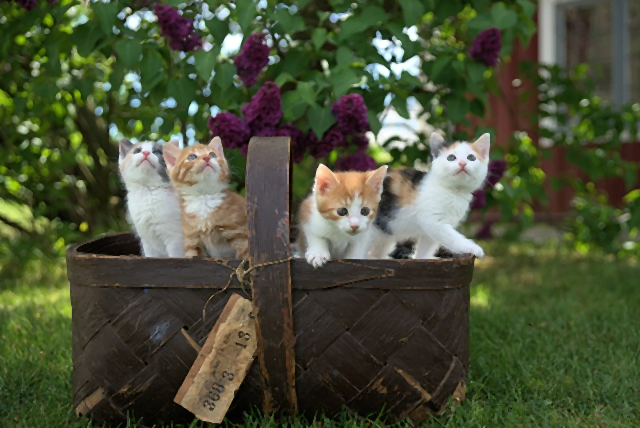

In [48]:
# Median Blur
median = cv.medianBlur(img, 3)
cv2_imshow(median)

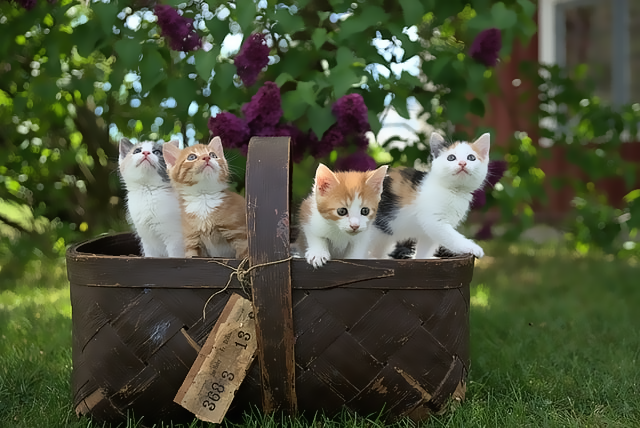

In [49]:

# Bilateral
bilateral = cv.bilateralFilter(img, 10, 35, 25)
cv2_imshow(bilateral)

## **BITWISE Operations**

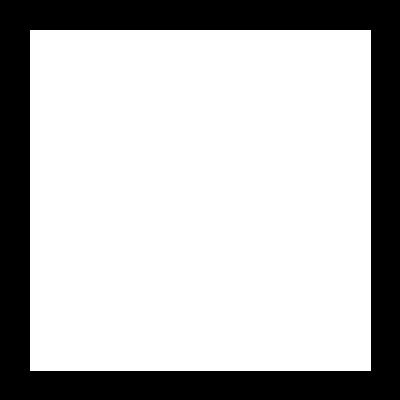

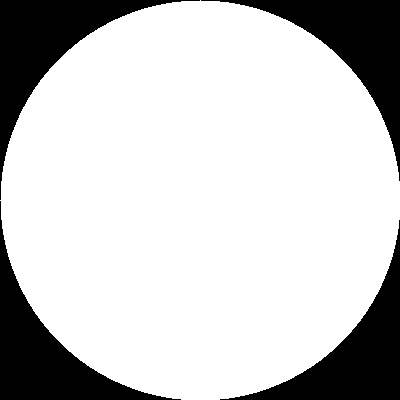

In [52]:
blank = np.zeros((400,400), dtype='uint8')

rectangle = cv.rectangle(blank.copy(), (30,30), (370,370), 255, -1)
circle = cv.circle(blank.copy(), (200,200), 200, 255, -1)

cv2_imshow(rectangle)
cv2_imshow(circle)

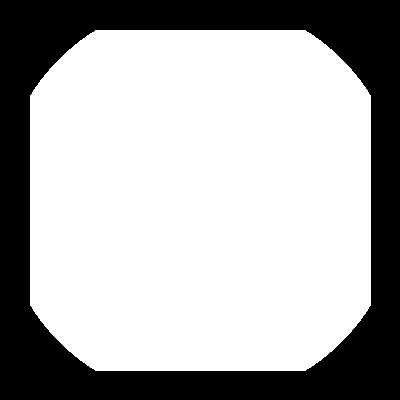

In [53]:
# bitwise AND --> intersecting regions
bitwise_and = cv.bitwise_and(rectangle, circle)
cv2_imshow(bitwise_and)

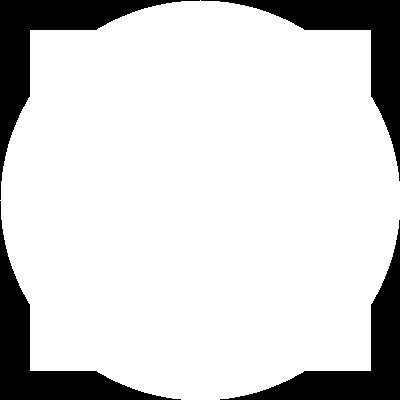

In [54]:
# bitwise OR --> non-intersecting and intersecting regions
bitwise_or = cv.bitwise_or(rectangle, circle)
cv2_imshow(bitwise_or)

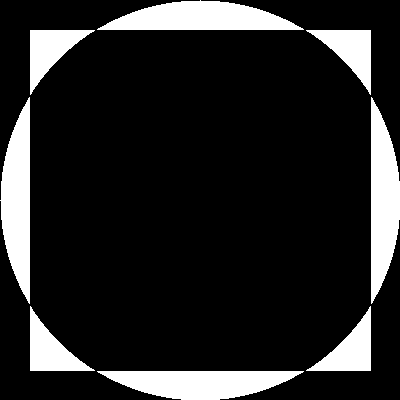

In [55]:
# bitwise XOR --> non-intersecting regions
bitwise_xor = cv.bitwise_xor(rectangle, circle)
cv2_imshow(bitwise_xor)

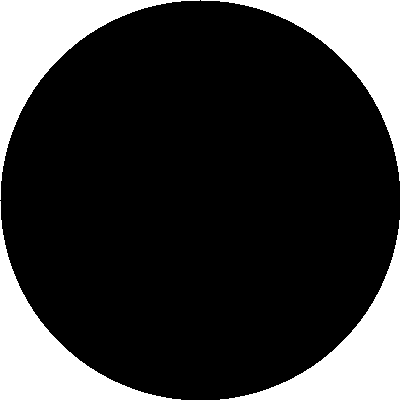

In [56]:

# bitwise NOT
bitwise_not = cv.bitwise_not(circle)
cv2_imshow(bitwise_not)

## **Masking**

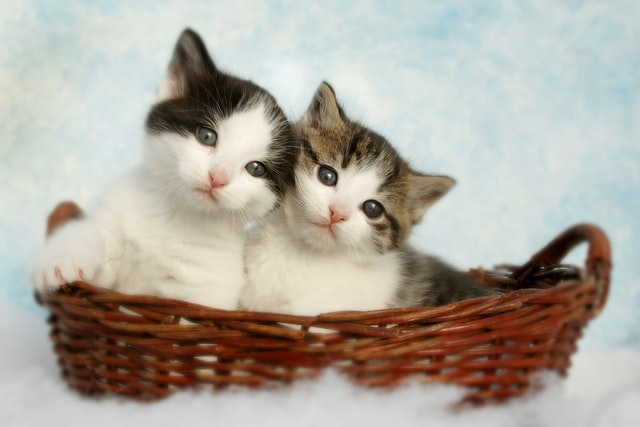

In [58]:
img = cv.imread('/content/drive/MyDrive/DataSets/Open_CV/Photos/cats 2.jpg')
cv2_imshow(img)

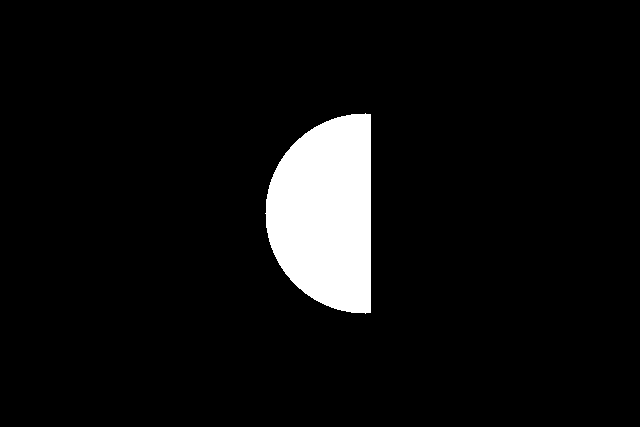

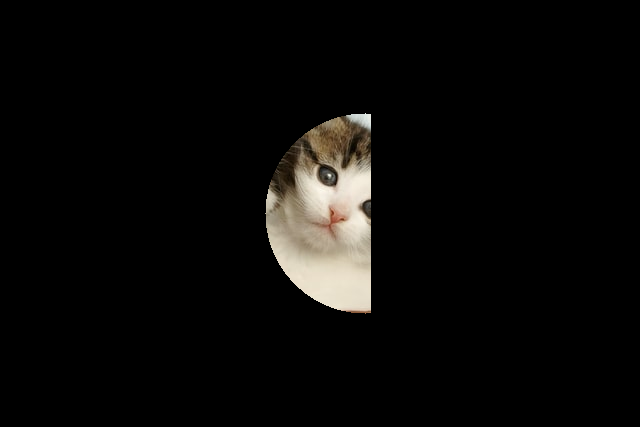

In [61]:
blank = np.zeros(img.shape[:2], dtype='uint8')
#cv2_imshow(blank)

circle = cv.circle(blank.copy(), (img.shape[1]//2 + 45,img.shape[0]//2), 100, 255, -1)

rectangle = cv.rectangle(blank.copy(), (30,30), (370,370), 255, -1)

weird_shape = cv.bitwise_and(circle,rectangle)
cv2_imshow(weird_shape)

masked = cv.bitwise_and(img,img,mask=weird_shape)
cv2_imshow(masked)

## **Histograms**
Tells about distribution of colour intensities in an image

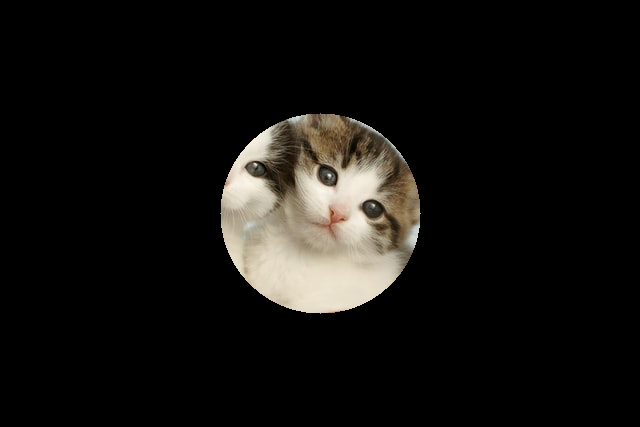

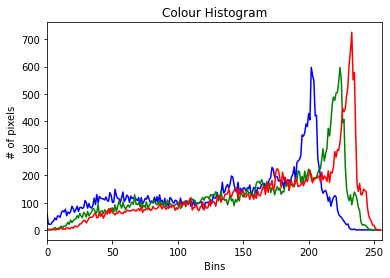

In [63]:
import matplotlib.pyplot as plt

blank = np.zeros(img.shape[:2], dtype='uint8')

# gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
# cv.imshow('Gray', gray)

mask = cv.circle(blank, (img.shape[1]//2,img.shape[0]//2), 100, 255, -1)

masked = cv.bitwise_and(img,img,mask=mask)
cv2_imshow(masked)

# GRayscale histogram
# gray_hist = cv.calcHist([gray], [0], mask, [256], [0,256] )

# plt.figure()
# plt.title('Grayscale Histogram')
# plt.xlabel('Bins')
# plt.ylabel('# of pixels')
# plt.plot(gray_hist)
# plt.xlim([0,256])
# plt.show()

# Colour Histogram

plt.figure()
plt.title('Colour Histogram')
plt.xlabel('Bins')
plt.ylabel('# of pixels')
colors = ('b', 'g', 'r')
for i,col in enumerate(colors):
    hist = cv.calcHist([img], [i], mask, [256], [0,256])
    plt.plot(hist, color=col)
    plt.xlim([0,256])

plt.show()

## **Gradients & Edge Detection**

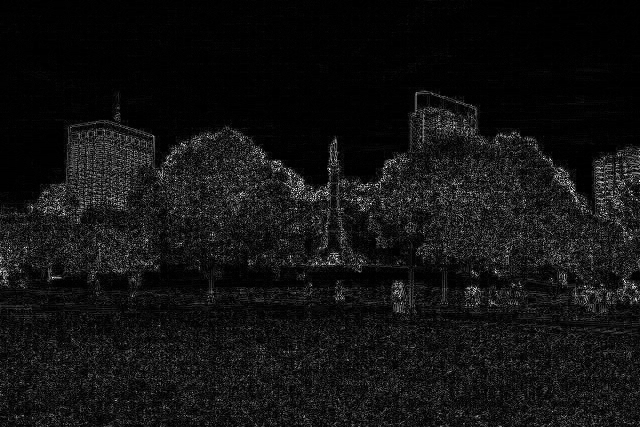

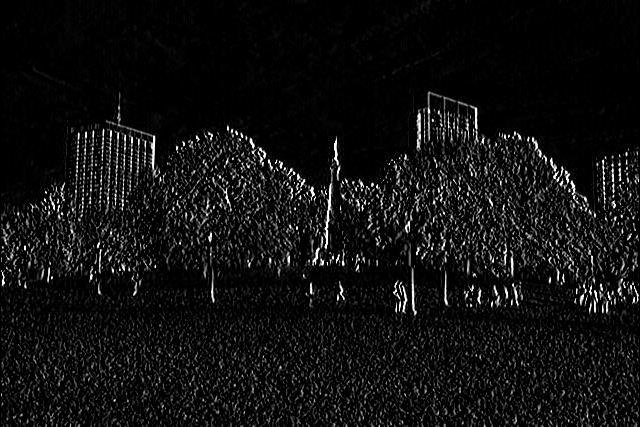

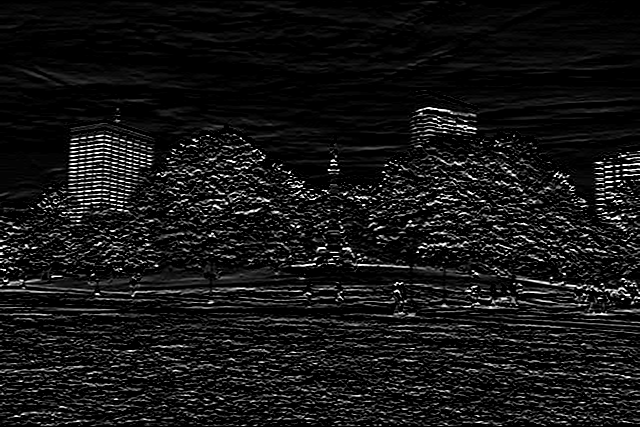

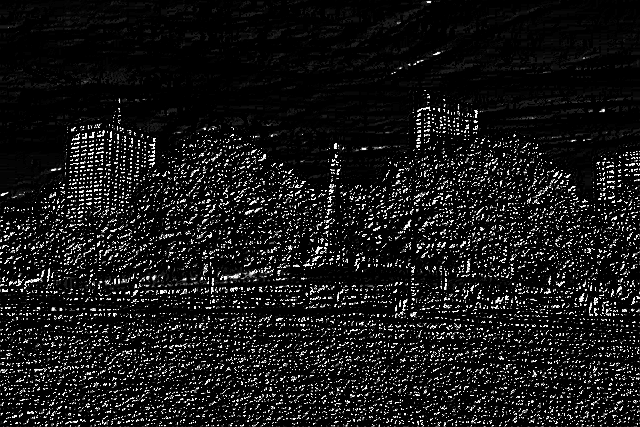

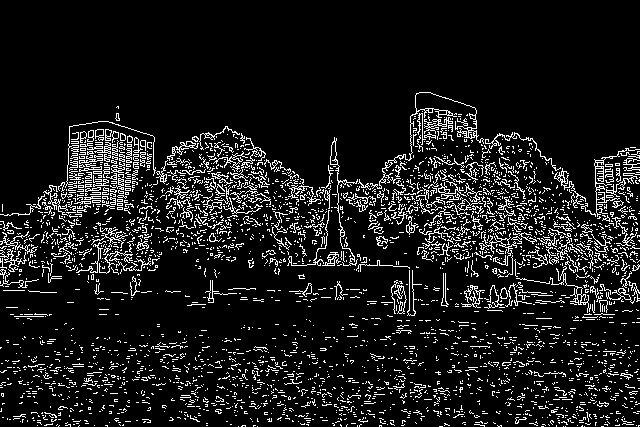

In [65]:
img = cv.imread('/content/drive/MyDrive/DataSets/Open_CV/Photos/park.jpg')
#cv2_imshow(img)

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
#cv2_imshow(gray)

# Laplacian
lap = cv.Laplacian(gray, cv.CV_64F)
lap = np.uint8(np.absolute(lap))
cv2_imshow(lap)

# Sobel 
sobelx = cv.Sobel(gray, cv.CV_64F, 1, 0)
sobely = cv.Sobel(gray, cv.CV_64F, 0, 1)
combined_sobel = cv.bitwise_or(sobelx, sobely)

cv2_imshow(sobelx)
cv2_imshow(sobely)
cv2_imshow(combined_sobel)

canny = cv.Canny(gray, 150, 175)
cv2_imshow(canny)


## **Face Detection with HAAR Cascades**

Number of faces found = 6


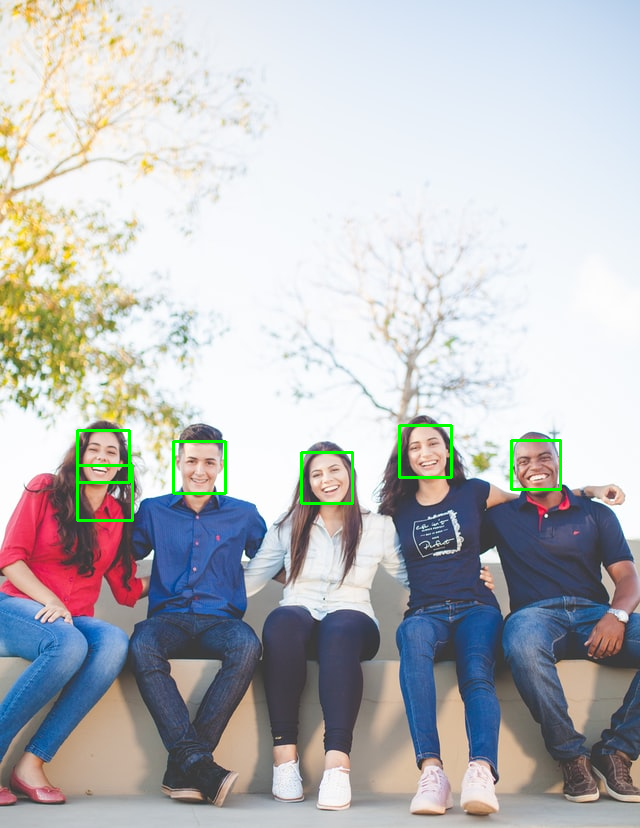

In [69]:
img = cv.imread('/content/drive/MyDrive/DataSets/Open_CV/Photos/group 2.jpg')
#cv2_imshow(img)

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
#cv2_imshow(gray)

haar_cascade = cv.CascadeClassifier('/content/drive/MyDrive/DataSets/Open_CV/haar_face.xml')

faces_rect = haar_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=6)

print(f'Number of faces found = {len(faces_rect)}')

for (x,y,w,h) in faces_rect:
    cv.rectangle(img, (x,y), (x+w,y+h), (0,255,0), thickness=2)

cv2_imshow(img)
# Haar Cascade is extremely sensitive to noise in an image, thats why it 
# sometimes detects more faces than actual.


## **Face Recognition with OpenCV's built-in recognizer**

In [75]:
import os
haar_cascade = cv.CascadeClassifier('/content/drive/MyDrive/DataSets/Open_CV/haar_face.xml')

people = ['Ben Afflek', 'Elton John', 'Jerry Seinfield', 'Madonna', 'Mindy Kaling']

features = []
labels = []
DIR = r'/content/drive/MyDrive/DataSets/Open_CV/Faces/train'

def create_train():
    for person in people:
        path = os.path.join(DIR, person)
        label = people.index(person)

        for img in os.listdir(path):
            img_path = os.path.join(path,img)

            img_array = cv.imread(img_path)
            if img_array is None:
                continue 
                
            gray = cv.cvtColor(img_array, cv.COLOR_BGR2GRAY)

            faces_rect = haar_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=4)

            for (x,y,w,h) in faces_rect:
                faces_roi = gray[y:y+h, x:x+w]
                features.append(faces_roi)
                labels.append(label)

create_train()
print('Training done ---------------')

features = np.array(features, dtype='object')
labels = np.array(labels)

face_recognizer = cv.face.LBPHFaceRecognizer_create()

# Train the Recognizer on the features list and the labels list
face_recognizer.train(features,labels)


face_recognizer.save('face_trained.yml')
np.save('features.npy', features)
np.save('labels.npy', labels)

Training done ---------------


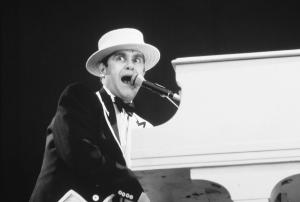

Label = Elton John with a confidence of 0.0


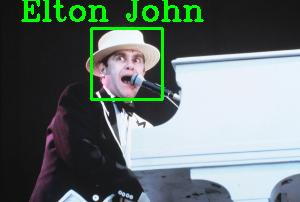

-1

In [78]:
features = np.load('features.npy', allow_pickle=True)
labels = np.load('labels.npy')

face_recognizer = cv.face.LBPHFaceRecognizer_create()
face_recognizer.read('face_trained.yml')

img = cv.imread('/content/drive/MyDrive/DataSets/Open_CV/Faces/train/Elton John/1.jpg')

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv2_imshow(gray)

# Detect the face in the image
faces_rect = haar_cascade.detectMultiScale(gray, 1.1, 4)

for (x,y,w,h) in faces_rect:
    faces_roi = gray[y:y+h,x:x+w]

    label, confidence = face_recognizer.predict(faces_roi)
    print(f'Label = {people[label]} with a confidence of {confidence}')

    cv.putText(img, str(people[label]), (20,20), cv.FONT_HERSHEY_COMPLEX, 1.0, (0,255,0), thickness=2)
    cv.rectangle(img, (x,y), (x+w,y+h), (0,255,0), thickness=2)

cv2_imshow(img)

cv.waitKey(0)